### Colour filter

In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
from scipy.spatial import distance
from collections import Counter

In [2]:
def extract_object_colors(image_path, num_colors=3):
    """
    Extract the most dominant colors from an image, ignoring the white background.
    Returns dominant colors in Lab space.
    """
    # Load image and convert to HSV
    image = cv2.imread(image_path)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Create mask to filter out white background (Saturation low & Brightness high)
    lower_white = np.array([0, 0, 200], dtype=np.uint8)
    upper_white = np.array([180, 30, 255], dtype=np.uint8)
    mask = cv2.inRange(hsv, lower_white, upper_white)
    
    # Invert mask to get object only
    object_mask = cv2.bitwise_not(mask)
    
    # Extract object pixels
    object_pixels = cv2.bitwise_and(image, image, mask=object_mask)
    
    # Convert to RGB
    object_pixels = cv2.cvtColor(object_pixels, cv2.COLOR_BGR2RGB)
    
    # Reshape and remove black pixels (caused by masking)
    pixels = object_pixels.reshape(-1, 3)
    pixels = pixels[np.all(pixels != [0, 0, 0], axis=1)]  # Remove black pixels

    if len(pixels) == 0:
        return None  # No valid pixels found
    
    # Find most frequent colors
    pixels_tuple = [tuple(p) for p in pixels]
    most_common_colors = [color for color, _ in Counter(pixels_tuple).most_common(num_colors)]
    
    # Convert to Lab space for better color comparison
    most_common_colors_lab = cv2.cvtColor(np.array([most_common_colors], dtype=np.uint8), cv2.COLOR_RGB2Lab)[0]
    
    return most_common_colors_lab

def color_distance(color_set_1, color_set_2):
    """
    Compute the minimum Euclidean distance between two sets of Lab colors.
    """
    return min(distance.euclidean(c1, c2) for c1 in color_set_1 for c2 in color_set_2)

def filter_images_by_color(query_image_path, database_folder, threshold=30, num_colors=3):
    """
    Filters images in a database based on color similarity.
    Returns a list of image paths that are within the color similarity threshold.
    """
    query_colors = extract_object_colors(query_image_path, num_colors=num_colors)
    if query_colors is None:
        return []  # No valid colors found
    
    matching_images = []
    count = 0

    for img_file in os.listdir(database_folder):

        count += 1

        if img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
            img_path = os.path.join(database_folder, img_file)
            
            db_colors = extract_object_colors(img_path, num_colors=num_colors)
            if db_colors is None:
                continue  # Skip images where no colors were detected
            
            # Compute color similarity
            if color_distance(query_colors, db_colors) < threshold:
                matching_images.append(img_path)
        
        if count % 100 == 0: print(f"{int(count/250)}0%")

    return matching_images

def load_cv2_image(path):
    """ Load an image using OpenCV and convert BGR to RGB for matplotlib """
    img_cv2 = cv2.imread(path)
    img_rgb = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
    return img_rgb

In [3]:
def save_color_info_to_csv(database_folder, csv_path, num_colors=3):
    """
    For each image in `database_folder`, extract the dominant colors (in Lab),
    and save them to a CSV at `csv_path`.
    
    The CSV will have columns:
       [filename, L1, a1, b1, L2, a2, b2, ..., L<num_colors>, a<num_colors>, b<num_colors>]
    """
    all_rows = []

    # Traverse all images in the folder
    for img_file in os.listdir(database_folder):
        if img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
            img_path = os.path.join(database_folder, img_file)
            # Extract the colors using your existing function
            colors_lab = extract_object_colors(img_path, num_colors=num_colors)
            if colors_lab is None:
                # Skip images where no valid colors were detected
                continue
            
            # Flatten the Lab values (shape: (num_colors, 3) -> list of length 3*num_colors)
            flattened_colors = colors_lab.flatten().tolist()
            
            # Prepare row: [filename, L1, a1, b1, L2, a2, b2, ...]
            row = [img_file] + flattened_colors
            all_rows.append(row)
    
    # Create column names
    columns = ['filename']
    for i in range(1, num_colors+1):
        columns += [f'L{i}', f'a{i}', f'b{i}']

    # Create a DataFrame and save to CSV
    df = pd.DataFrame(all_rows, columns=columns)
    df.to_csv(csv_path, index=False)
    print(f"Color info CSV saved to: {csv_path}")


def filter_images_by_color_from_csv(query_image_path, csv_path, database_folder, threshold=30, num_colors=3):
    """
    Loads color info from CSV and filters images by color similarity with the query image.
    Returns a list of matching image paths.
    """
    # 1) Extract colors from the query image
    query_colors = extract_object_colors(query_image_path, num_colors=num_colors)
    if query_colors is None:
        return []

    # 2) Load CSV into a DataFrame
    df = pd.read_csv(csv_path)
    
    matching_images = []
    for index, row in df.iterrows():
        # Reconstruct the Lab color set for the database image from the CSV row
        colors_flat = []
        for i in range(1, num_colors+1):
            l = row[f'L{i}']
            a = row[f'a{i}']
            b = row[f'b{i}']
            colors_flat.append([l, a, b])
        
        # Convert to a NumPy array (shape: (num_colors, 3))
        db_colors = np.array(colors_flat, dtype=np.float32)

        # Compute color similarity
        dist = color_distance(query_colors, db_colors)

        # If below the threshold, it's considered a match
        if dist < threshold:
            # Reconstruct the full path from the original folder + filename
            img_path = os.path.join(database_folder, row['filename'])
            matching_images.append(img_path)
    
    return matching_images

In [4]:
def plot_query_and_matches(query_image, filtered_images):
    """
    Plots the query image and matching images in a grid.
    Parameters:
        query_image (str): Path to the query image file.
        filtered_images (list of str): List of paths to matched images.
    """
    # Number of matched images
    num_images = len(filtered_images)

    # If there are images to display
    if num_images > 0:
        # Determine the layout: if too many images, split into multiple rows.
        # We add 1 to num_images because the first slot is for the query image.
        cols = min(num_images + 1, 5)  # Max 5 per row (query + 4 results)
        rows = math.ceil((num_images + 1) / cols)

        fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))

        # If there's more than one row, axs is a 2D array. Flatten to 1D for easier indexing.
        axs = np.array(axs).reshape(-1)

        # Show the query image in the first subplot
        axs[0].imshow(load_cv2_image(query_image))
        axs[0].set_title("Query Image", fontsize=12, fontweight="bold")
        axs[0].axis("off")

        # Show filtered images in the subsequent subplots
        for i, img_file in enumerate(filtered_images, start=1):
            axs[i].imshow(load_cv2_image(img_file))
            axs[i].set_title(f"Match {i}", fontsize=10)
            axs[i].axis("off")

        # Hide any unused subplots
        for j in range(i + 1, len(axs)):
            axs[j].axis("off")

        plt.tight_layout()
        plt.show()

    else:
        print("No filtered images to display.")

In [5]:
# Example usage:
database_folder = "../../data/DAM"
csv_path = '../../data/color_database.csv'

save_color_info_to_csv(database_folder, csv_path, num_colors=3)

Color info CSV saved to: ../../data/color_database.csv


In [6]:
query_image_path = "../../data/preprocessed_test/image-20210928-102713-12d2869d.jpg"
threshold = 30
matching_images = filter_images_by_color_from_csv(
    query_image_path=query_image_path,
    csv_path=csv_path,
    database_folder=database_folder,
    threshold=threshold,
    num_colors=3
)

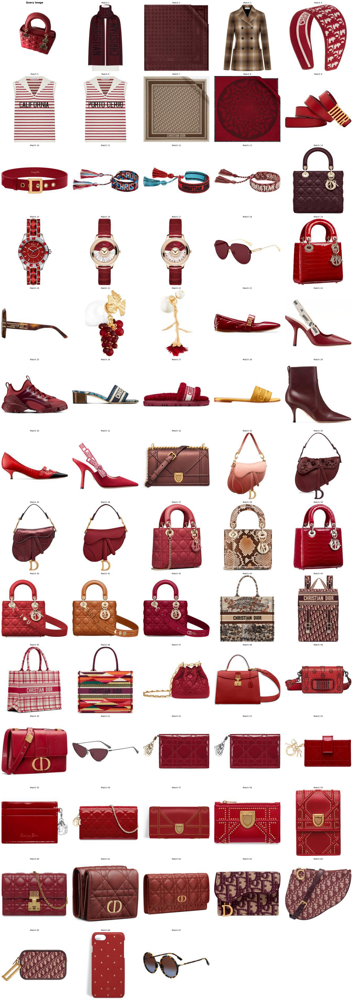

In [7]:
plot_query_and_matches(query_image_path, matching_images)